# Image Classification Using Cross Correlation

In this assignment, we will use cross correlation to classify images refer to American Sign Language.

Imports

In [1]:
import os
import pandas as pd
import argparse
import numpy as np
import cv2
import pylab as pl

Function for loading all images from different folders

In [2]:
def load_images(folder):
    #load all images from folders
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename),cv2.IMREAD_GRAYSCALE)
        if img is not None:
            images.append(img)
    return images

Function for calculating normalized cross correlation

In [3]:
def ncc(roi, target):
    #calculate normalized cross correlation
    cor = np.sum(roi * target)
    nor = np.sqrt( (np.sum(roi ** 2))) * np.sqrt(np.sum(target ** 2))
    return cor / nor

To match templates we need to perform filter-like top-left to bottom-right walking operation. This function finds maximum peak by doing walking operation. And returns the detected region coordinates and the predicted letter.

In [4]:
def template_matching(img, sign_letters):
    
    (max_Y, max_X) = (0, 0)
    MaxValue = 0
    counter = 0
    for target in sign_letters:

        height, width = img.shape
        tar_height, tar_width = target.shape


        #set image, target and result matrix
        img = np.array(img, dtype="int")
        target = np.array(target, dtype="int")
        NccValue = np.zeros((height-tar_height, width-tar_width))

        # calculate value from top-left to bottom-right
        for y in range(0, height-tar_height):
            for x in range(0, width-tar_width):
 
                roi = img[y : y+tar_height, x : x+tar_width]
                #calculate normalized cross correlation
                NccValue[y, x] = ncc(roi, target)
                # choose maximum peak
                if NccValue[y, x] > MaxValue:
                    MaxValue = NccValue[y, x]
                    (max_Y, max_X) = (y, x)
                    
                    index = counter
                    #print(index)
        counter +=1
    return (max_X, max_Y), index

Now we will loop through to the target images. Using obtanined results from template_matching() function we will draw bounding boxes on top the images. In this part I also created a dataset to store image name, it's label and prediction. I will use the dataset for to accuracy calculation and confusion matrix operations

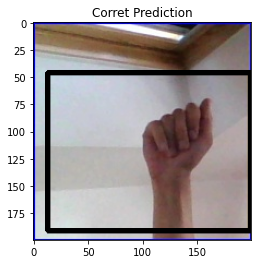

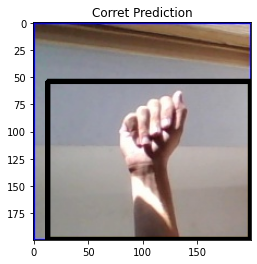

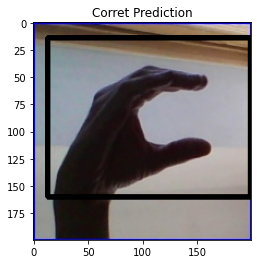

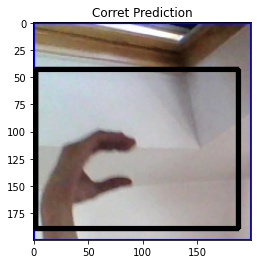

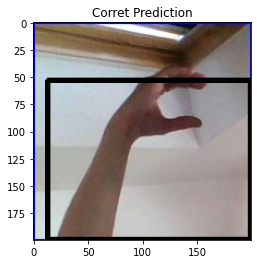

...

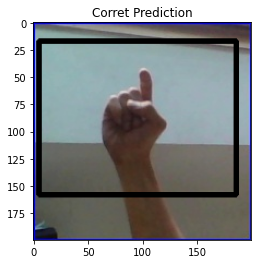

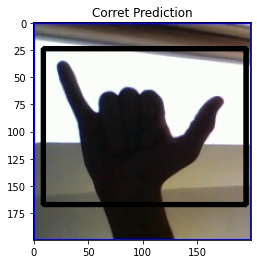

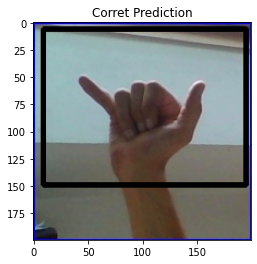

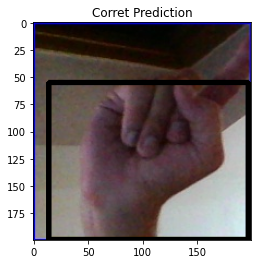

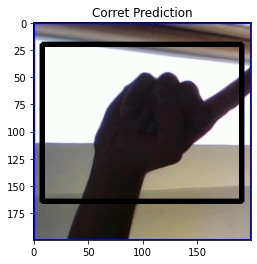

In [5]:
sign_letters = load_images("dataset/template")
#create dataframe for labels
df = pd.DataFrame(columns = ['Image Name', 'Label', 'Prediction'])

for subdir, dirs, files in os.walk("dataset/target"):
    #print(subdir.split("\\")[-1])
    target = cv2.imread("dataset/template/" + subdir.split("\\")[-1]+ ".png", 0)
    for file in files:
        #print(os.path.join(subdir, file))
        image = cv2.imread(os.path.join(subdir, file), 0)
        image2 = cv2.imread(os.path.join(subdir, file), 1)

        height, width = target.shape

        top_left, index = template_matching(image, sign_letters)
        #plot rectagle on predicted region
        cv2.rectangle(image2, top_left, (top_left[0] + width, top_left[1] + height), 0, 3)
        letters = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z']
        #print(letters[index].upper())

        df = df.append({'Image Name' : os.path.join(subdir, file).split("\\")[-1], 'Label' : subdir.split("\\")[-1], 'Prediction' : letters[index].upper()}, ignore_index = True)
        # show correct results
        if(subdir.split("\\")[-1] == letters[index].upper()):
        
            pl.subplot(111)
            pl.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
            pl.title('Corret Prediction')
            pl.show()
        

All information is saved in dataset

In [6]:
df

,Image Name,Label,Prediction
0,A1.jpg,A,Z
1,A1001.jpg,A,J
2,A101.jpg,A,Z
3,A1101.jpg,A,B
4,A1201.jpg,A,E
...,...,...,...
775,Z501.jpg,Z,T
776,Z601.jpg,Z,L
777,Z701.jpg,Z,C
778,Z801.jpg,Z,T


In this part I am comparing is label and prediction same. If they are same, this means we made prediction correctly. Looks like we made 77 correct predictions

In [7]:
print((df['Label'] == df['Prediction']).value_counts())  

False    703
True      77
dtype: int64


In [8]:
from sklearn.metrics import confusion_matrix

We created our confusion matrix. Now we can visualize them.

In [9]:
cf_matrix = confusion_matrix(df['Label'], df['Prediction'])
print(cf_matrix)

[[ 2  1  0  3  3  0  0  0  0  1  0  3  0  4  0  0  0  1  3  0  0  0  0  1
   0  8]
 [ 0  0  1  3  4  2  1  0  0  4  3  0  0  1  0  0  0  1  3  3  1  0  0  1
   0  2]
 [ 0  0 10  8  0  0  1  1  0  0  0  6  0  0  0  0  0  1  0  0  0  0  0  0
   0  3]
 [ 0  0  2  4  0  1  1  1  0  0  1  8  2  2  1  0  0  1  1  2  1  0  0  0
   0  2]
 [ 3  0  0  2  1  1  2  0  2  2  1  0  0  5  0  0  0  0  6  1  0  0  0  1
   0  3]
 [ 0  1  0  2  3  1  3  0  0  5  0  0  3  1  0  0  0  3  1  1  0  0  0  1
   3  2]
 [ 0  0  1  1  0  4  5  1  2  3  0  3  2  1  0  3  0  0  1  1  0  0  0  0
   1  1]
 [ 0  0  0  1  0  1  3  3  3 10  1  5  1  0  0  0  1  0  0  1  0  0  0  0
   0  0]
 [ 0  0  0  2  1  1  6  1  1  2  1  2  5  3  0  0  0  1  0  1  0  0  0  1
   0  2]
 [ 0  0  0  0  0  1  4  1  0 10  0  5  2  2  0  0  0  0  0  2  0  0  0  3
   0  0]
 [ 0  1  2  2  0  0  2  1  0  0  2  6  4  0  0  0  0  1  1  2  3  1  1  1
   0  0]
 [ 1  0  2  3  1  2  2  1  1  0  0  9  0  1  0  0  0  2  0  2  2  0  0  1
   0  0]
 [ 1

Before visualization, we can make our confusion matrix more understandble. This code part converts our matrix to dataframe and assigns letter number. Othervise annotations will be 0-26 which is harder to analyze

In [10]:
#ABCDEFGHIJKLMNOPQRSTUVWXYZ
df_cm = pd.DataFrame(cf_matrix, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXYZ"],
                  columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXYZ"])

<AxesSubplot:>

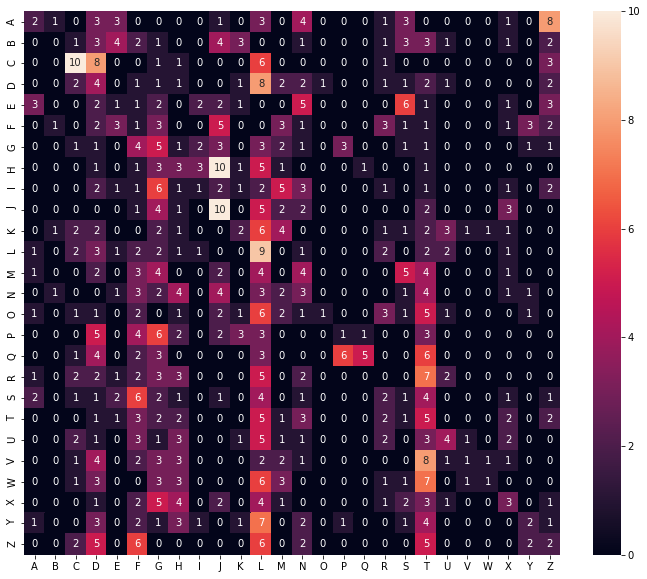

In [11]:
import seaborn as sns
from matplotlib import rcParams
rcParams['figure.figsize'] = 12,10
sns.heatmap(df_cm, annot=True)

### Histogram of Oriented Gradients

This time we will do the same operations using histogram of oriented gradients(HOGs)

In [12]:
from skimage.feature import hog

In [13]:
image = cv2.imread("dataset/template/B.png", 0)
fd, hog_image = hog(image, orientations=8, pixels_per_cell=(16, 16),
                    cells_per_block=(1, 1), visualize=True)

In [14]:
hog_image.shape

(145, 185)

Now we created hog image. The image is one channel but looks blue when we display. I didn't find a solution for this. I believe cv2 show one channel blue version instead grey one.

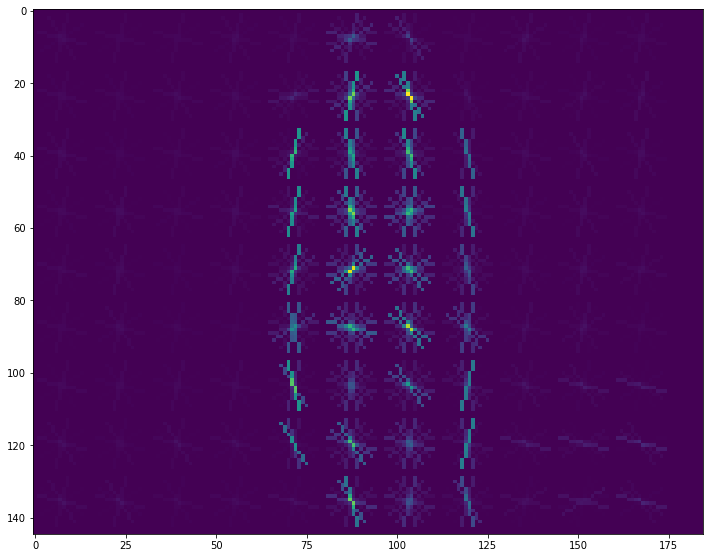

In [15]:
pl.imshow(hog_image)

Remaining operations are same with the upper part

P
C
C
P
T
T
Q
G
C
T
T
T
J
P
Q
X
Q
F
G
Q
H
T
T
C
C
Q
C
Q
Q
M
Q
T
Q
T
Z
G
Q
Q
T
T
G
L
X
Q
F
Z
X
Q
Q
T
P
Q
Q
Q
L
Z
G
C
Q
Q
Q
T
C


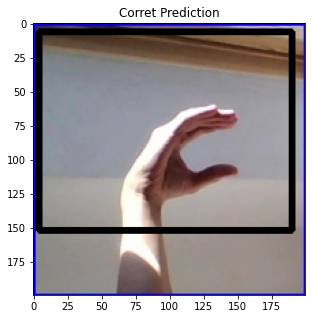

T
T
Q
T
Z
T
J
T
Q
Z
H
F
Q
Z
Q
Q
X
Q
N
M
G
C


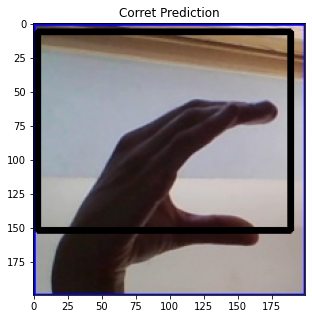

L
Q
H
Q
P
Q
Q
Q
T
H
G
L
Q
Q
Q
L
Q
L
G
J
T
Z
Q
T
Q
Q
M
Q
X
Q
Q
Q
Q
X
C
Q
T
C
G
T
Q
T
T
T
C
T
T
T
S
F
L
Q
J
T
C
Q
T
C
Q
C
G
X
Q
C
X
C
L
T
H
T
X
Q
L
T
P
Q
T
G
X
F


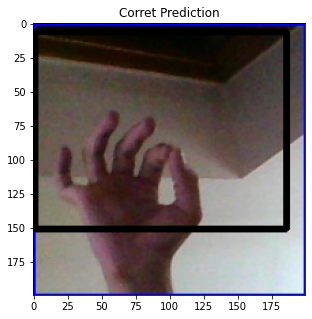

Q
Q
G
T
Q
M
H
Q
Q
X
Q
C
C
C
C
Q
G


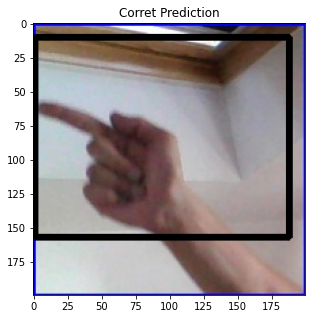

J
H
L
Q
T
Q
T
L
Q
T
F
G


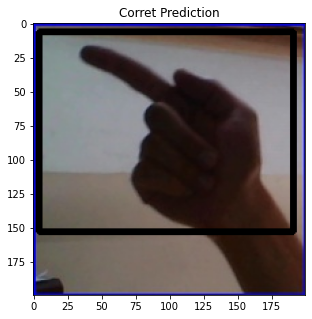

J
D
L
D
Q
Q
M
Q
Q
J
X
Q
Q
J
T
C
C
Q
C
T
Q
T
Q
T
Q
H


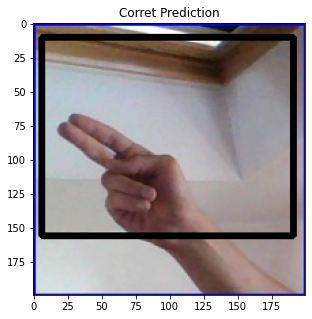

T
L
X
N
J
J
J
Q
J
Q
C
G
Q
Q
C
C
Q
L
Q
H


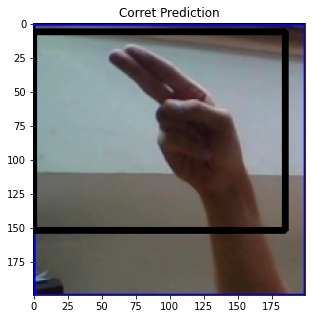

L
Q
X
Z
P
T
T
T
T
T
Q
T
Q
X
J
Q
Q
Z
T
C
C
H
Q
Q
T
Q
X
C
C
C
C
T
Q
T
J


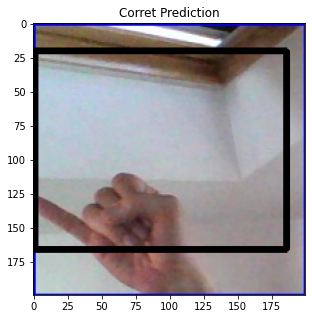

Z
T
T
C
T
T
T
Q
T
L
Q
L
D
Q
Q
C
J


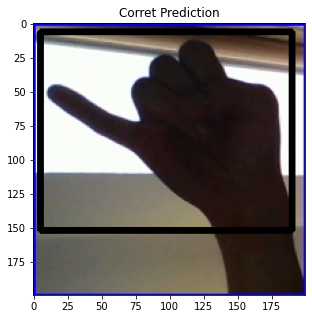

J


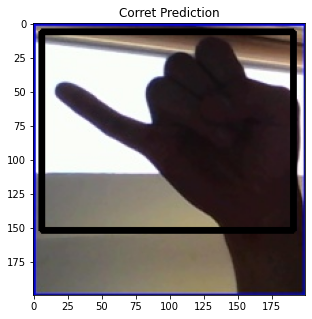

T
Q
Q
N
T
Q
T
C
G
T
Z
T
T
T
H
T
T
T
Q
F
C
X
L
Z
L
G
Q
C
C
Q
X
G
T
N
G
C
T
Q
Z
Q
P
T
Q
T
Q
T
H
Q
T
L


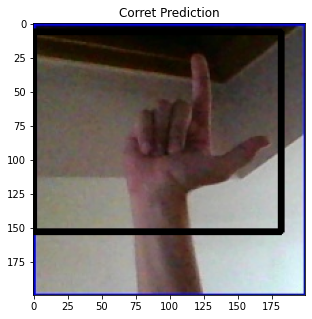

C
G
K
Q
T
Q
Q
Q
T
Q
X
Q
Q
Q
N
T
Q
Q
T
Q
T
G
G
Z
G
T
Q
T
T
L
Q
G
T
J
G
J
J
M


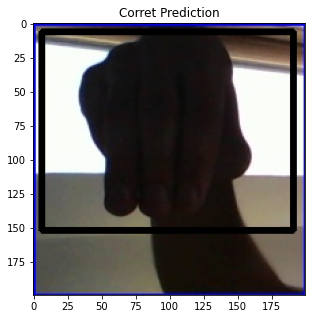

T
Q
C
J
X
Q
M


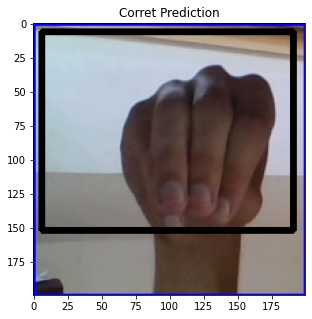

Q
T
T
L
T
T
H
C
J
J
T
H
T
J
Z
Z
Z
C
Z
Z
J
G
J
Q
Q
Q
T
T
X
Q
M
T
T
T
P
Z
J
J
T
T
T
T
T
Q
L
Q
F
Z
M
Q
T
M
G
Q
Q
J
G
T
Q
C
Q
H
T
T
Q
T
Q
H
T
J
Q
T
Q
J
Q
C
Q
L
Q
J
Q
C
Q
G
Q
T
H
Q
C
Q
C
C
H
Q


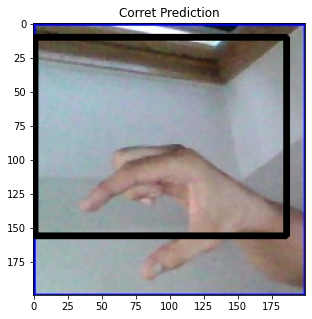

C
Q


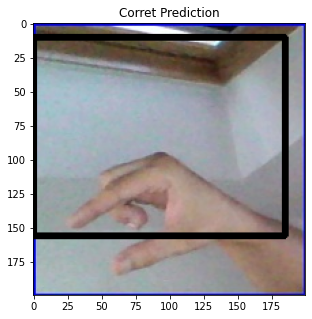

T
T
Q


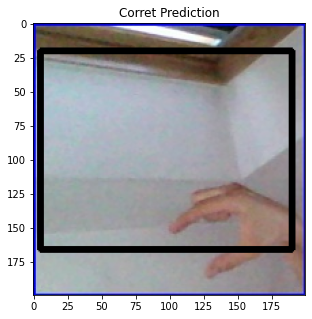

T
Q


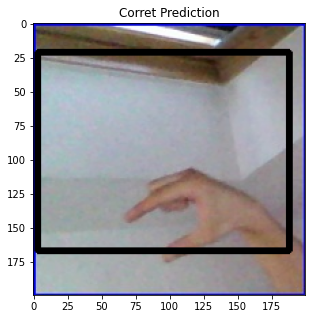

T
Q


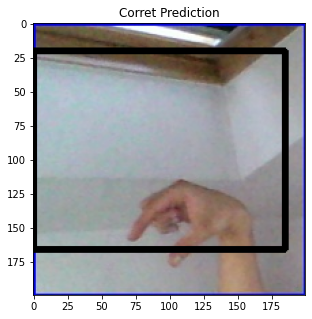

T
Q


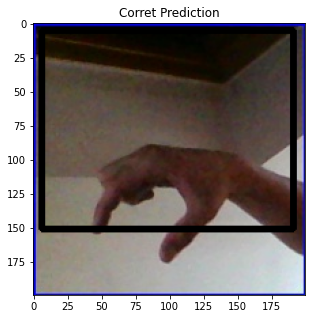

Q


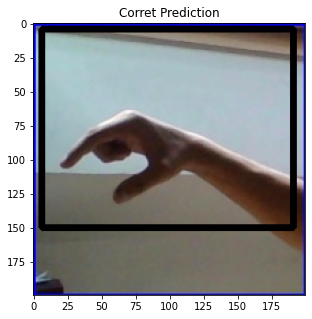

D
J
Q


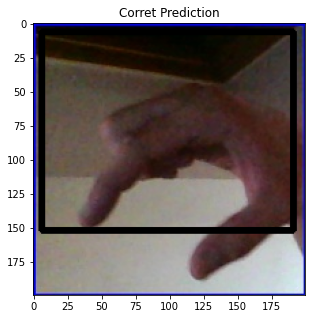

D
Q


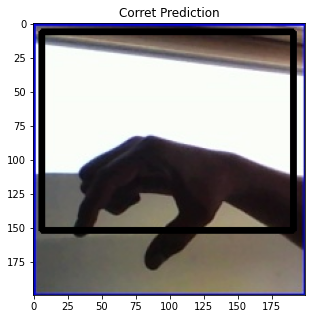

Q


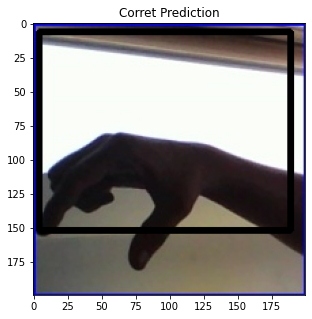

G
Q


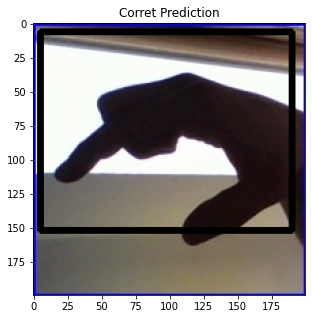

Q


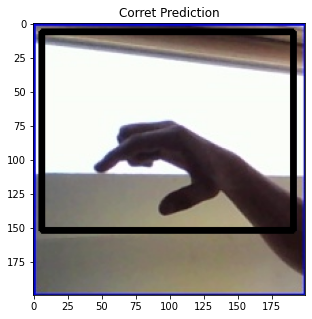

Q


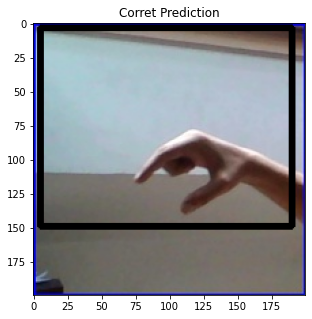

N
Q


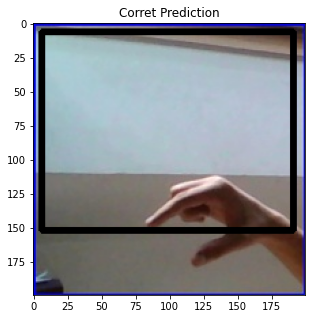

T
Q


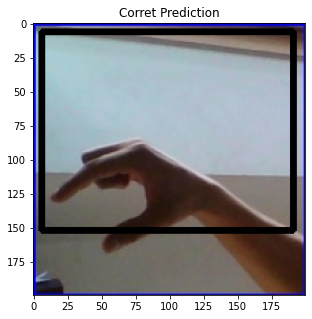

X
Q


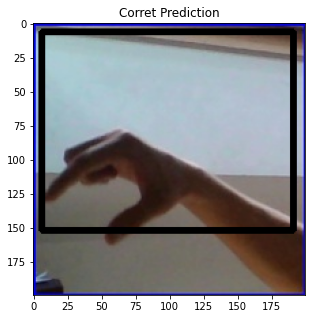

Q
T
X
J
J
J
J
Q
T
G
T
J
H
Q
Z
J
Z
J
S
Q
G
Q
G
T
Q
T
Q
Q
Q
Q
M
Q
Q
T
Q
P
G
C
C
J
T
T
J
C
J
T
Q
L
C
C
Q
Q
Q
Q
G
M
P
Q
C
T
C
Q
T


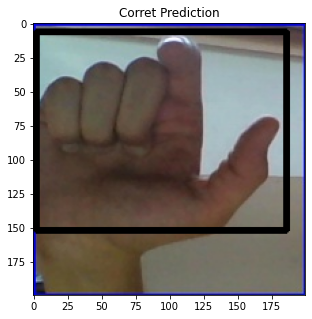

T


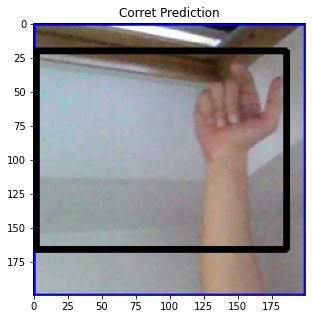

J
T


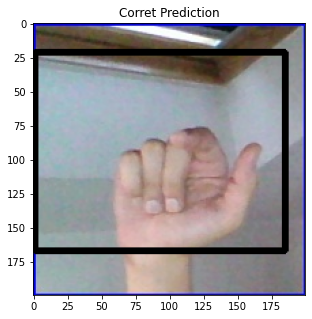

T


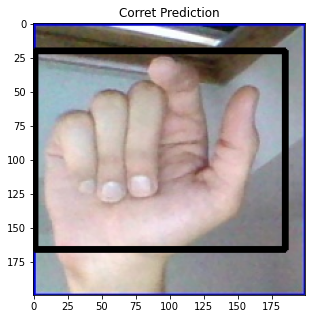

Q
D
Q
Q
T


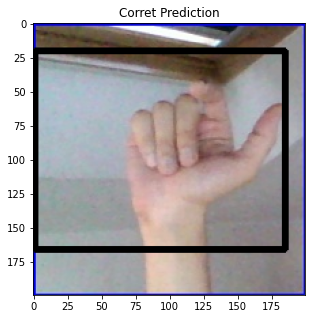

Q
Q
L
Z
D
D
C
C
S
Q
S
N
C
C
C
X
Q
T


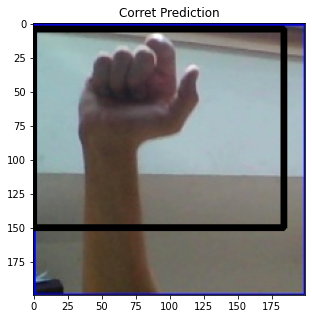

Q
T
Q
J
T
J
T
T
T
T
T
G
J
Q
Z
D
Q
Q
Q
S
G
T
Q
X
Q
Q
C
T
Q
G
Q
J
T
T
G
J
Q
T
Q
J
T
T
G
T
G
G
X
G
T
C
C
N
G
Z
Q
Q
C
X
C
C
T
J
C
J
T
P
T
P
G
T
T
T
Q
N
H
H
J
G
X
P
C
L
N
N
T
X
C
G
C
C
Q
Z
Q
P
T
Q
T
T
T
G
T
Q
Q
C
L
Q
D
Q
Q
Q
C
L
T
C
X


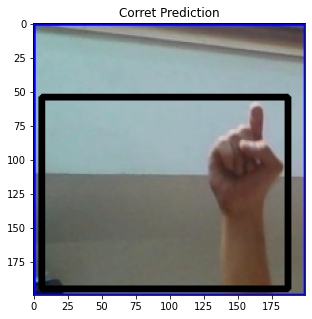

Q
P
C
Q
P
P
T
X
Q
J
Q
T
J
T
T
T
Q
T
Q
F
G
Q
D
T
J
M
S
Q
T
X
Q
Q
P
D
C
G
T
Q
T
P
T
T
G
T
W
Q
T
T
C
D
Z


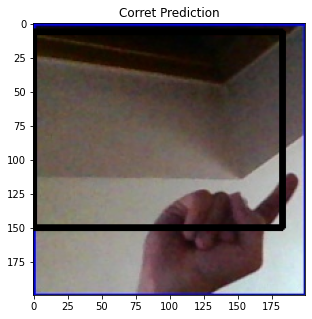

G
Q
G
Q
T
M
Q
C
X
H
Q
Q
Q
Q


In [16]:
rcParams['figure.figsize'] = 5,5
sign_letters = load_images("dataset/template")

df_hog = pd.DataFrame(columns = ['Image Name', 'Label', 'Prediction'])

for subdir, dirs, files in os.walk("dataset/target"):

    target = cv2.imread("dataset/template/" + subdir.split("\\")[-1]+ ".png", 0)
    for file in files:

        image = cv2.imread(os.path.join(subdir, file), 0)
        image2 = cv2.imread(os.path.join(subdir, file), 1)
        
        fd, hog_image = hog(image, orientations=8, pixels_per_cell=(16, 16),
                    cells_per_block=(1, 1), visualize=True)

        height, width = target.shape

        top_left, index = template_matching(hog_image, sign_letters)
        cv2.rectangle(image2, top_left, (top_left[0] + width, top_left[1] + height), 0, 3)
        letters = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z']
        print(letters[index].upper())

        df_hog = df_hog.append({'Image Name' : os.path.join(subdir, file).split("\\")[-1], 'Label' : subdir.split("\\")[-1], 'Prediction' : letters[index].upper()}, ignore_index = True)
        # show results
        if(subdir.split("\\")[-1] == letters[index].upper()):
        
            pl.subplot(111)
            pl.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
            pl.title('Correct Prediction')
            pl.show()

In [17]:
df_hog

,Image Name,Label,Prediction
0,A1.jpg,A,P
1,A1001.jpg,A,C
2,A101.jpg,A,C
3,A1101.jpg,A,P
4,A1201.jpg,A,T
...,...,...,...
775,Z501.jpg,Z,H
776,Z601.jpg,Z,Q
777,Z701.jpg,Z,Q
778,Z801.jpg,Z,Q


In [18]:
print((df_hog['Label'] == df_hog['Prediction']).value_counts())  

False    743
True      37
dtype: int64


In [19]:
cf_matrix_hog = confusion_matrix(df_hog['Label'], df_hog['Prediction'])
print(cf_matrix_hog)

[[ 0  0  6  0  0  1  2  1  0  1  0  0  1  0  0  3  7  0  0  7  0  0  0  1
   0  0]
 [ 0  0  1  0  0  1  3  0  0  0  0  2  0  0  0  1 12  0  0  5  0  0  0  2
   0  3]
 [ 0  0  2  0  0  1  1  2  0  1  0  1  1  1  0  1  9  0  0  6  0  0  0  1
   0  3]
 [ 0  0  1  0  0  0  2  1  0  1  0  3  1  0  0  0 15  0  0  3  0  0  0  2
   0  1]
 [ 0  0  6  0  0  1  2  0  0  1  0  1  0  0  0  0  6  0  1 10  0  0  0  2
   0  0]
 [ 0  0  5  0  0  1  2  2  0  0  0  2  1  0  0  1  8  0  0  5  0  0  0  3
   0  0]
 [ 0  0  1  2  0  1  2  1  0  4  0  3  1  0  0  0 10  0  0  4  0  0  0  1
   0  0]
 [ 0  0  5  0  0  0  1  2  0  4  0  2  0  1  0  0 10  0  0  4  0  0  0  1
   0  0]
 [ 0  0  5  0  0  0  0  1  0  1  0  1  0  0  0  1  8  0  0  8  0  0  0  3
   0  2]
 [ 0  0  3  1  0  0  0  0  0  3  0  2  0  1  0  0  8  0  0 11  0  0  0  0
   0  1]
 [ 0  0  5  0  0  1  4  1  0  0  0  2  0  1  0  0  3  0  0  9  0  0  0  2
   0  2]
 [ 0  0  1  0  0  0  1  1  0  0  1  1  0  1  0  1 14  0  0  7  0  0  0  1
   0  1]
 [ 0

In [20]:
df_cm_hog = pd.DataFrame(cf_matrix_hog, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXYZ"],
                  columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXYZ"])

<AxesSubplot:>

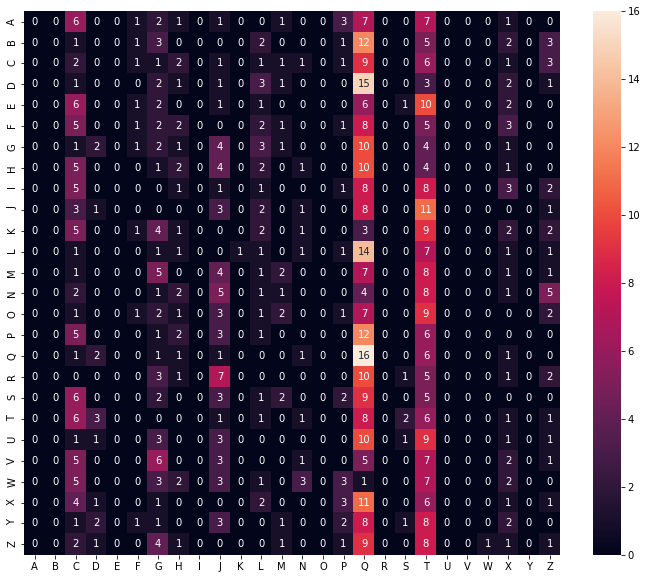

In [21]:
rcParams['figure.figsize'] = 12,10
sns.heatmap(df_cm_hog, annot=True)